Make sure that you have all of the following packages installed:

In [ ]:
%pip install mkdocs libpysal esda geopandas tqdm

In [14]:
import geopandas as gpd
import pandas as pd
import sys
import os

sys.path.append(os.path.abspath(os.path.join(os.pardir)))
from VASA.preprocessing.prep import filter_data, filter_map, group_data, local_moran
from VASA.static_choropleth.static_choropleth import StackedChoropleth

Put your data file under the data/ folder and read in the file

In [15]:
# THIS CELL MAY NEED TO BE CHANGED

# Make sure the name of your data file matches in this string. If you don't have a csv, you'll need to change the function to json, or zip etc...
mob_data = pd.read_csv("../data/all_minor_sources.csv")

mob_data.head()

,fips,ds_m4,all_day_bing_tiles_visited_relative_change,all_day_ratio_single_tile_users,dex,num_devices,dex_a,num_devices_a,state_m2,county_m2,...,cmi,userbase_share,cue_devices,sheltered_in_place_7days_rolling_avg,state_name,county_name,county_vmt,sg_sheltered,sg_avg_dist2,device_count
0,45035,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.575363,0.000667,40672.255666,0.282728,South Carolina,Dorchester,2440000.0,0.319371,11066.255084,11889.0
1,45035,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.989247,0.000677,41266.684594,0.279174,South Carolina,Dorchester,3400000.0,0.257536,13048.934918,11412.0
2,45035,2020-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,4.030501,0.000686,41851.595967,0.275851,South Carolina,Dorchester,3950000.0,0.246068,13383.727687,11444.0
3,45035,2020-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.905002,0.000682,41587.471566,0.278619,South Carolina,Dorchester,3570000.0,0.281261,11845.334563,11548.0
4,45035,2020-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.716130,0.000678,41352.963981,0.278791,South Carolina,Dorchester,2810000.0,0.312370,9796.491319,11512.0


In [16]:
# THIS CELL MAY NEED TO BE CHANGED

# Make sure this string matches the column name for the mobility values
# If you have multiple measures in your dataset, it's easiest if you just pick one
columns = [
    'sg_sheltered'
]

# Make sure this string matches the column name you have for the dates
date_col = "ds_m4"

# Make sure this string matches the column name you have for the county fips
fips_col = "fips"



# This is just used to put text on the plot, it doesn't really make what it says...
titles = [
    '% sheltered (Safegraph)'
]

In [30]:
from __future__ import annotations
from typing import Literal, Tuple, Callable

import numpy as np
from numpy.core.records import array
import pandas as pd
import geopandas as gpd
import libpysal as lps
from esda import Moran_Local

from functools import partial, reduce
from concurrent import futures
from multiprocessing import cpu_count, Pool
from datetime import datetime as dt


class VASA:
    """
    A standard data object for VASA plots


    Parameters
    ----------


    Attributes
    ----------


    Examples
    --------
    >>> import libpysal


    """
    def __init__(
        self,
        df: str | pd.DataFrame,
        gdf: gpd.GeoDataFrame,
        df_group_col: str = "fips",
        gdf_group_col: str = "fips",
        date_col: str = "date",
        date_format: str = "%Y-%m-%d",
        temp_res: Literal["day", "week", "month", "year"] = "week"
    ) -> None:
        if isinstance(df, str):
            df = pd.read_csv(df)
        elif not isinstance(df, pd.DataFrame):
            raise Exception("Data not of proper type")

        self.df = df.copy()
        self.df_group_col = df_group_col
        self.gdf = gdf
        self.gdf_group_col = gdf_group_col
        self.date_col = date_col
        self.date_format = date_format
        self.temp_res = temp_res

        self.cols: list[str] = list(
            {*df.columns} - {self.df_group_col, self.date_col}
        )

        # Convert date column to dates
        if isinstance(self.df[self.date_col].dtypes, object):
            self.df[self.date_col] = self.df[self.date_col].apply(
                lambda x: dt.strptime(x, self.date_format).date()
            )
        # NUMPY DATES ??

        # self.group()

    # WE NEED TO CHECK IF THERE IS ONLY ONE GROUP.
    # IF WE ONLY HAVE DATES Jan 1-6, Are these always grouped together?
    def group(self) -> None:
        # pass in functions other than mean
        agg_dict = dict(zip(
            [*self.cols, self.date_col],
            [*np.repeat(np.nanmean, len(self.cols)), "min"]
        ))

        if self.temp_res == "day":
            # assign year_month_day
            grouped = self.df
        elif self.temp_res == "week":
            year_week = [
                get_year_week(date)
                for date in self.df[self.date_col]
            ]

            grouped = self.df \
                .assign(
                    year_week=year_week
                ) \
                .groupby(["year_week", self.df_group_col]) \
                .agg(agg_dict) \
                .reset_index() \
                .groupby(["year_week"])

        elif self.temp_res == "month":
            # assign year_month
            grouped = self.df
        elif self.temp_res == "year":
            # assign year
            grouped = self.df
        else:
            raise Exception("Incorrect temporal resolution")

        # this is going to have to be based on the map or something
        output = pd.DataFrame()
        for _, group in grouped:
            ordered = pd.merge(
                self.gdf, group,
                left_on=self.gdf_group_col, right_on=self.df_group_col,
                how='left'
            )

            output = output.append({
                "date": ordered.loc[0, self.date_col],
                **{c: ordered[c] for c in self.cols}
            }, ignore_index=True)

        self.fips_order = ordered[self.gdf_group_col]
        self.df = output
        # return (output, ordered[self.gdf_group_col])

    # specify column...
    def get_county(self, fips: int, date="all") -> list[int]:
        i = list(self.fips_order).index(fips)
        return [row[self.cols[0]][i] for _, row in self.df.iterrows()]

    # df / list idk, specify columns
    def get_week(self, i: int) -> pd.DataFrame:
        return self.df.loc[i, self.cols[0]]

    def save_output(self, date, fips, vars):
        return 1

    def lisa(self) -> None:
        num_processes = cpu_count()

        W = lps.weights.Queen(self.gdf["geometry"])
        W.transform = 'r'

        with Pool(num_processes) as pool:
            self.df[self.cols[0]] = list(
                pool.map(
                    partial(func, col=self.cols[0],
                            W=W, sig=0.05, which="fdr"),
                    [row for _, row in self.df.iterrows()]
                )
            )

    def reduce(
        self,
        reduce: (
            Literal["count", "recency"] |
            Callable[[list[list[int]]], list[int]]
        )
    ):
        copy = self.df.copy()

        if reduce == "count":
            reduce = reduce_by_count
        elif reduce == "count_hh":
            reduce = reduce_by_count_hh
        elif reduce == "count_ll":
            reduce = reduce_by_count_ll
        elif reduce == "recency":
            reduce = reduce_by_recency
        elif reduce == "mode":
            reduce = reduce_by_mode

        return copy[self.cols].agg(reduce).assign(fips=self.fips_order)


def reduce_by_count(arr: list[list[int]]) -> list[int]:
    print("REDUCING BY COUNT")
    hh_ll = reduce(
        lambda acc, curr: [(a[0] + (c == 1), a[1] + (c == 2)) for a, c in zip(acc, curr)],
        arr,
        [(0, 0) for _ in range(len(arr[0]))]
    )
    return list(map(
        lambda x: max(x),
        hh_ll
    ))


def reduce_by_count_hh(arr: list[list[int]]) -> list[int]:
    return reduce_by_count_equals(arr, 1)


def reduce_by_count_ll(arr: list[list[int]]) -> list[int]:
    return reduce_by_count_equals(arr, 2)


def reduce_by_count_equals(arr: list[list[int]], val: int) -> list[int]:
    return reduce(
        lambda acc, curr: np.array(acc) + (np.array(curr) == val),
        arr
    )

# ughhh this needs to be fixed
def reduce_by_recency(arr: list[list[int]]) -> list[int]:
    return [
        (hh if clas == 1 else (ll if clas == 2 else 0))
        for hh, ll, clas in zip(reduce_by_recency_hh(arr), reduce_by_recency_ll(arr), reduce_by_mode(arr))
    ]

def reduce_by_recency_hh(arr: list[list[int]]) -> list[int]:
    return reduce_by_recency_equals(arr, 1)


def reduce_by_recency_ll(arr: list[list[int]]) -> list[int]:
    return reduce_by_recency_equals(arr, 2)


def reduce_by_recency_equals(arr: list[list[int]], val: int) -> list[int]:
    return [
        max([
            (idx if week[county_idx] == val else 0)
            for idx, week in enumerate(arr)
        ])
        for county_idx in range(len(arr[0]))
    ]


# not really mode b/c prefers sig over non-sig
def reduce_by_mode(arr: list[list[int]]) -> list[int]:
    output: list[int] = []

    for hh, ll in zip(reduce_by_count_hh(arr), reduce_by_count_ll(arr)):
        is_sig = max(hh, ll) > 0
        region_class = 1 if hh > ll else 2
        output.append(region_class if is_sig else 0)

    return output


def func(ordered, col, W, sig, which):
    return moran_quadrants(ordered[col], W, sig, which=which)

# esda fdr is not strictly doing fdr


def false_discovery_rate(arr, sig):
    df = pd.DataFrame(arr, columns=["p"]).sort_values("p")
    df["i"] = np.arange(1, len(arr) + 1) * sig / len(arr)
    df["sig"] = df["p"] < df["i"]
    return list(df.sort_index()["sig"])


def bonferroni(arr, sig):
    return list(np.array(arr) < sig / len(arr))


# We don't want to filter
def filter_quadrants(arr):
    return [(a if a < 3 else a) for a in arr]


# this needs to change if we don't filter
def combine(sim, fdr, bon):
    return [
        (b + 4 if b != 0 else (f + 2 if f != 0 else s))
        for b, f, s in zip(bon, fdr, sim)
    ]

#
#
#
#
#

#
# This function runs the local moran test for us and returns an array of
# the quadrant classification for each county
#
#


def moran_quadrants(col, W, alpha, which):
    local_moran = Moran_Local(col, W, geoda_quads=True,
                              permutations=n_permutations(col))

    ps = local_moran.p_sim
    qs = filter_quadrants(local_moran.q)

    if which == "fdr":
        f = false_discovery_rate(ps, alpha)
    elif which == "sim":
        f = [p < alpha for p in ps]
    elif which == "bon":
        f = bonferroni(ps, alpha)
    elif which == "all":
        fdr = false_discovery_rate(ps, alpha)
        bon = bonferroni(ps, alpha)
        sim = [p < alpha for p in ps]

        qs = combine(
            qs * np.array(sim),
            qs * np.array(fdr),
            qs * np.array(bon)
        )
        f = sim
    else:
        raise 'Valid p-value evaluations: "bon", "fdr", or "sim"'

    return list(qs * np.array(f))


def n_permutations(df):
    return 999  # default value


def get_year_week(date: dt) -> Tuple[int, int]:
    """
    get_year_week [summary]

    Args:
        date (dt): [description]

    Returns:
        Tuple[int, int]: [description]
    """
    week_num = date.isocalendar()[1]
    year = date.year

    if week_num == 1 and date.month == 12:
        year += 1
    elif week_num == 53 and date.month == 1:
        year -= 1

    # Year comes first so dataframe is sorted chronologically
    return (year, week_num)


In [18]:
mob_data = mob_data[["ds_m4", "fips", "sheltered_in_place_7days_rolling_avg"]]

In [84]:
mob_data.loc[0, "ds_m4"]

'2020-01-01'

In [18]:
for a, b in mob_data.head().iterrows():
    print(a)
    print(b)
    break

0
ds_m4                                   2020-01-01
fips                                         45035
sheltered_in_place_7days_rolling_avg      0.282728
Name: 0, dtype: object


In [157]:
del v

In [25]:
v = VASA(data, usa_map, date_col="ds_m4")

In [26]:
v.group()

In [27]:
v.lisa()

In [31]:
v.reduce("recency")

,sheltered_in_place_7days_rolling_avg,fips
0,39,6075
1,51,25025
2,55,31007
3,55,37181
4,55,48421
...,...,...
3100,50,32005
3101,55,29163
3102,55,19079
3103,55,19027


In [47]:
import matplotlib.pyplot as plt


def scatterplot(v):

    count = v.reduce("count")
    recent = v.reduce('recency')

    # combined = count.merge(
    #     recent,
    #     left_on="fips",
    #     right_on="fips",
    #     suffixes=("_c", "r")
    # )

    fig, axes = plt.subplots(
        1,
        1,
        figsize=(8, 8)
    )
    fig.tight_layout()

    for j, col in enumerate(v.cols):
        # Row wise:
        ax = axes

        ys = count[col]
        xs = recent[col]

        create_scatter(ax, xs, ys)


def create_scatter(ax, xs, ys):
    ax.scatter(xs, ys, c="blue", alpha=0.3)
    plt.xlim((0.5 , max(xs) + 0.5))
    plt.ylim((0.5, max(ys) + 0.5))
    # slope = 1 line
    # ax.plot(range(0, max(xs) + 1), range(0, max(xs) + 1))

REDUCING BY COUNT


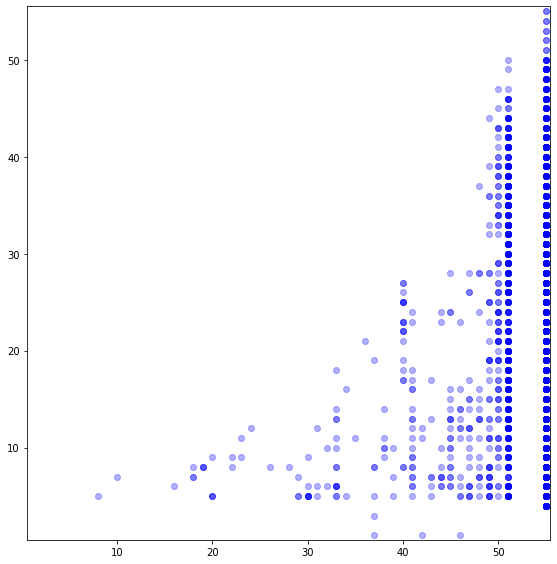

In [48]:
scatterplot(v)

The following cell may take a few minutes to run:

In [19]:
# Read the map 
usa_map_data = pd.read_json("../data/counties.json")
usa_map = gpd.GeoDataFrame \
    .from_features(usa_map_data["features"]) \
    .set_crs(epsg=4326) \
    .to_crs("+proj=aea +lat_1=20 +lat_2=60 +lat_0=40 +lon_0=-96 +x_0=0 +y_0=0 +datum=NAD83 +units=m +no_defs")
usa_map = usa_map.assign(fips=[int(g) for g in usa_map["GEOID"]])
usa_map = filter_map(usa_map)

# Group the data into weeks
data = filter_data(mob_data, fips_col)
# grouped_usa = group_data(data, columns, date_col, fips_col, by="week")

In [5]:
from tqdm import tqdm
import numpy as np
import pandas as pd
from concurrent import futures
from multiprocessing import cpu_count, Pool

num_processes = cpu_count()
print(num_processes)

df = pd.DataFrame({i: np.random.randint(1, 1000, size=100000) for i in ['a','b','c']})

def func(a, b):
    return a + b

with futures.ProcessPoolExecutor(num_processes) as pool:
    df["result"] = list(tqdm(pool.map(func, df['a'], df['b'], chunksize=10), total=df.shape[0]))

df.head()

8
100%|██████████| 100000/100000 [00:01<00:00, 87763.01it/s]


,a,b,c,result
0,53,710,622,763
1,950,878,841,1828
2,638,664,355,1302
3,798,487,520,1285
4,659,896,417,1555


In [75]:
import libpysal as lps
from esda import Moran_Local, Moran
import matplotlib.pyplot as plt
from matplotlib import colors
import pandas as pd
import numpy as np
from tqdm import tqdm
import math
from typing import List
from datetime import datetime as dt

from functools import partial

def func(tup, col, W, sig, which):
    ordered, date = tup
    return [date, moran_quadrants(ordered[col], W, sig, which=which)]
    

def local_moran(grouped, cols, date_col: str, group_col: str, map_data: pd.DataFrame, map_group_col: str, limit=None, sig=0.05, which="fdr"):
    if not isinstance(cols, list):
        cols = [cols]

    output = pd.DataFrame(
        columns=[*cols, 'date']
    )

    W = lps.weights.Queen(map_data["geometry"])
    W.transform = 'r'

    def group_with_map(group):
        ordered = pd.merge(
            map_data, group, left_on=map_group_col, right_on=group_col, how='left'
        )
        return ordered
        # return { "ordered": ordered, "col": cols[0], "W": W, "sig": sig, "which": which }

    df = pd.DataFrame()
    df["fips"] = map_data[map_group_col]

    with Pool(num_processes) as pool:
        output = list(tqdm(pool.map(partial(func, col=cols[0], W=W, sig=sig, which=which), [(group_with_map(group), date) for date, group in grouped]))

    for d, m in output:
        df[d] = m

    print(df.head())

    return (1, 2)

    # for i, (date, group) in tqdm(enumerate(grouped), total=min(limit, len(grouped)):

    #     if limit and i == limit:
    #         break 

    #     if group.isnull().values.any():
    #         continue

    #     # it's important we merge on map so grouping order is consistent
    #     ordered = pd.merge(
    #         map_data, group, left_on=map_group_col, right_on=group_col, how='left'
    #     )

    #     row = {
    #         'date': [min(group['date_start']), max(group['date_end'])] if ('date_start' in ordered.columns) else min(group[date_col])
    #     }

    #     for j, col in enumerate(cols):
    #         mq = moran_quadrants(ordered[col], W, sig, which=which)
    #         row[col] = mq
            
    #     output = output.append(row, ignore_index=True)

    # return (output, map_data[map_group_col])

SyntaxError: invalid syntax (<ipython-input-75-939b7f7b3000>, line 43)

In [76]:

# Run the local moran tests
data_usa, fips_order = local_moran(
    grouped_usa,
    columns,
    date_col,
    fips_col,
    usa_map,
    "fips" # this is the column in the map
)

# This progress bar shows which week we're on for the local moran calculations:

100%|██████████| 56/56 [00:00<00:00, 506209.10it/s]    fips  (2020, 1)  (2020, 2)  (2020, 3)  (2020, 4)  (2020, 5)  (2020, 6)  \
0   6075          0          0          0          0          0          0   
1  25025          0          0          0          0          0          0   
2  31007          0          0          0          0          0          0   
3  37181          0          0          0          0          0          0   
4  48421          0          0          0          0          0          0   

   (2020, 7)  (2020, 8)  (2020, 9)  ...  (2020, 47)  (2020, 48)  (2020, 49)  \
0          0          0          0  ...           1           0           1   
1          0          0          0  ...           1           1           1   
2          0          0          0  ...           0           0           0   
3          0          0          0  ...           0           0           0   
4          0          0          0  ...           0           0           0   

   (2

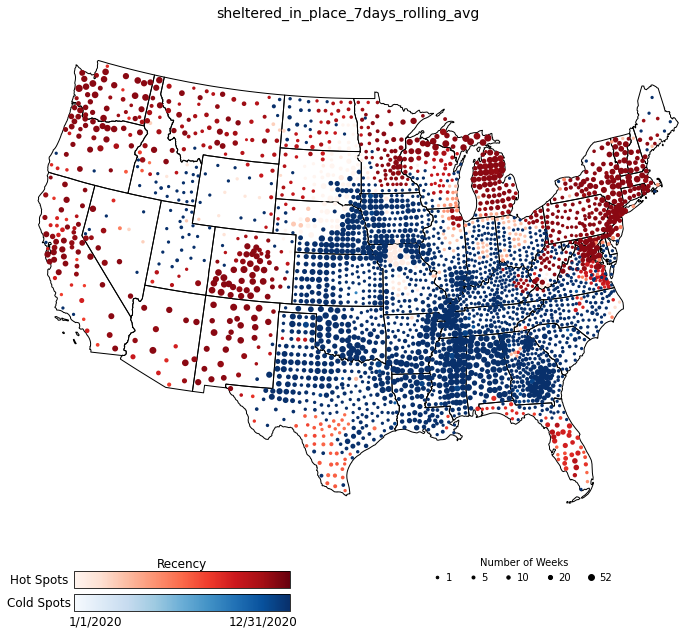

In [33]:
choro = StackedChoropleth(
    v.gdf,
    v.df,
    v.cols,
    main_folder="../test_figures",
    titles=v.cols
)

# This should display an image in your ntoebook and save it under tests_figures/combined/
choro.plot_both()

In [29]:
ds_data = gpd.GeoDataFrame(v.gdf.assign(
    dat = v.df.loc[0, v.cols[0]]
))

In [40]:
# meta = dd.utils.make_meta()

dds_data = dd.from_pandas(ds_data, npartitions=1)

In [60]:
import dask.dataframe as dd
import spatialpandas as spd

In [61]:
spd_gdf = spd.GeoDataFrame(ds_data, geometry="geometry")

In [58]:
spd_gdf.loc[0, "geometry"]

MultiPolygon([[[-2168086.7641331316, 33798.99719007601, -2165624.188342101, 33912.42731954541, -2164759.036639249, 35438.13845696663, -2166040.9275987046, 36911.345462798774, -2165064.1070833425, 43012.77718144949, -2165606.514141137, 44991.143154468286, -2171134.1080043656, 45992.338458623795, -2175821.666456344, 43697.36650392208, -2176465.8290320043, 39531.03064840984, -2176962.349219155, 36316.966376731, -2168086.7641331316, 33798.99719007601]]])

In [56]:
spd_gdf.astype({ "geometry": spd.geometry.MultiPolygon })

TypeError: dtype '<class 'spatialpandas.geometry.multipolygon.MultiPolygon'>' not understood

In [62]:
import datashader as ds
import colorcet

cvs = ds.Canvas(600, 400)
cvs.points(spd_gdf, geometry='geometry')

TypeError: Cannot interpret 'MultiPolygonDtype(float64)' as a data type

In [20]:
v.df[v.cols[0]][0][1163]

0

In [14]:
v.get_county(6073)

KeyError: 'key of type tuple not found and not a MultiIndex'